In [1]:
## Import Packages
from __future__ import print_function

import numpy as np
import pandas as pd
from itertools import product

#Astro Software
import astropy.units as units
from astropy.coordinates import SkyCoord
from astropy.io import fits

#Plotting Packages
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams

import seaborn as sns

from PIL import Image

from yt.config import ytcfg
import yt
import yt.units as u

#Scattering NN
import torch
import torch.nn.functional as F
from torch import optim
from kymatio.torch import Scattering2D
device = "cpu"

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.decomposition import PCA, FastICA

import skimage
from skimage import filters

from scipy.optimize import curve_fit
from scipy import linalg
from scipy import stats
from scipy.signal import general_gaussian

#I/O
import h5py
import pickle
import glob
import copy
import time

#Plotting Style
%matplotlib inline
#plt.style.use('dark_background')
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 20
rcParams['font.family'] = 'sans-serif'

#Threading
torch.set_num_threads=2
from multiprocessing import Pool

import ntpath
def path_leaf(path):
    head, tail = ntpath.split(path)
    out = os.path.splitext(tail)[0]
    return out

def hd5_open(file_name,name):
    f=h5py.File(file_name,'r', swmr=True)
    data = f[name][:]
    f.close()
    return data

from matplotlib.colors import LinearSegmentedColormap
cdict1 = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
blue_red1 = LinearSegmentedColormap('BlueRed1', cdict1,N=5000)

from sklearn.preprocessing import StandardScaler

/opt/miniconda3/envs/IWST/lib/python3.8/_collections_abc.py:666: MatplotlibDeprecationWarning: The global colormaps dictionary is no longer considered public API.
  self[key]


In [2]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

In [15]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784')

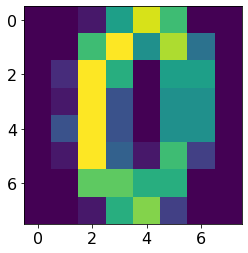

In [6]:
plt.imshow(digits.images[10])

In [9]:
digits.target[1:8]

array([1, 2, 3, 4, 5, 6, 7])

In [10]:
mnist_train_y = hd5_open('../scratch_AKS/data/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../scratch_AKS/data/mnist_test_y.h5','main/data')

In [11]:
mnist_train_y

array([5, 0, 4, ..., 5, 6, 8])

In [17]:
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [18]:
mnist.target

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [22]:
mnist_test_y[-4:]

array([3, 4, 5, 6])

In [23]:
mnist.data

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
from io import BytesIO
from PIL import Image
import base64

In [25]:
def embeddable_image(data):
    img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((64, 64), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

In [26]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

output_notebook()

Loading BokehJS ...

''
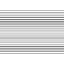

In [35]:
embeddable_image(np.array(mnist.data.iloc[1]))

In [36]:
std_class = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class')
std_class_both = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class_both')
std_class_ref = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','std_class_ref')
equiv_std = hd5_open('../from_cannon/2021_03_09/equiv_workup_L3.h5','equiv_std_full')

In [39]:
mnist_train_y = hd5_open('../../DHC/scratch_AKS/data/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../../DHC/scratch_AKS/data/mnist_test_y.h5','main/data')

In [40]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

def cm_eval(y_pred, y_true,n_classes):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[y_true[indx],y_pred[indx]] += 1
    return cm.astype(int)

In [41]:
mnist_DHC_out_train_L4s = hd5_open('../from_cannon/2021_03_09/mnist_DHC_train_eq_L4_s.h5','main/data')
mnist_DHC_out_test_L4s = hd5_open('../from_cannon/2021_03_09/mnist_DHC_test_eq_L4_s.h5','main/data')

In [42]:
mnist_DHC_out_train_L4s_angles = hd5_open('../from_cannon/2021_03_09/mnist_DHC_train_eq_L4_s.h5','main/angles')
mnist_DHC_out_test_L4s_angles = hd5_open('../from_cannon/2021_03_09/mnist_DHC_test_eq_L4_s.h5','main/angles')

In [44]:
NtestAngle = mnist_DHC_out_test_L4s_angles.shape[0]
NtrainAngle = mnist_DHC_out_train_L4s_angles.shape[0]

angle_test = np.tile(mnist_DHC_out_test_L4s_angles,10000)
angle_test_class = np.repeat(mnist_test_y,NtestAngle)

angle_train = np.tile(mnist_DHC_out_train_L4s_angles,60000)
angle_train_class = np.repeat(mnist_train_y,NtrainAngle)

In [372]:
lb = LabelBinarizer()
train_y_onehot = lb.fit_transform(angle_train_class)

lb = LabelBinarizer()
test_y_onehot = lb.fit_transform(angle_test_class)

In [45]:
NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,2))
tst_slice = np.isin(angle_test_class,2)

X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_trx = np.array([
    np.cos(2*np.mod(angle_train[tr_slice],np.pi))
]).T

X_testx = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testx = np.array([
    np.cos(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_trx, Y_trx)
y_pred_testx = reg.predict(X_testx)
y_pred_trainx = reg.predict(X_trx)

train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

In [47]:
NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,2))
tst_slice = np.isin(angle_test_class,2)

X_try = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_try = np.array([
    np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
]).T

X_testy = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testy = np.array([
    np.sin(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_try, Y_try)
y_pred_testy = reg.predict(X_testy)
y_pred_trainy = reg.predict(X_try)

train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))

In [69]:
l2 = np.square(y_pred_testx-Y_testx) + np.square(y_pred_testy-Y_testy)
l2x = np.square(y_pred_testx-Y_testx)
l2y = np.square(y_pred_testy-Y_testy)
l2min = np.min([l2x,l2y],axis=0)

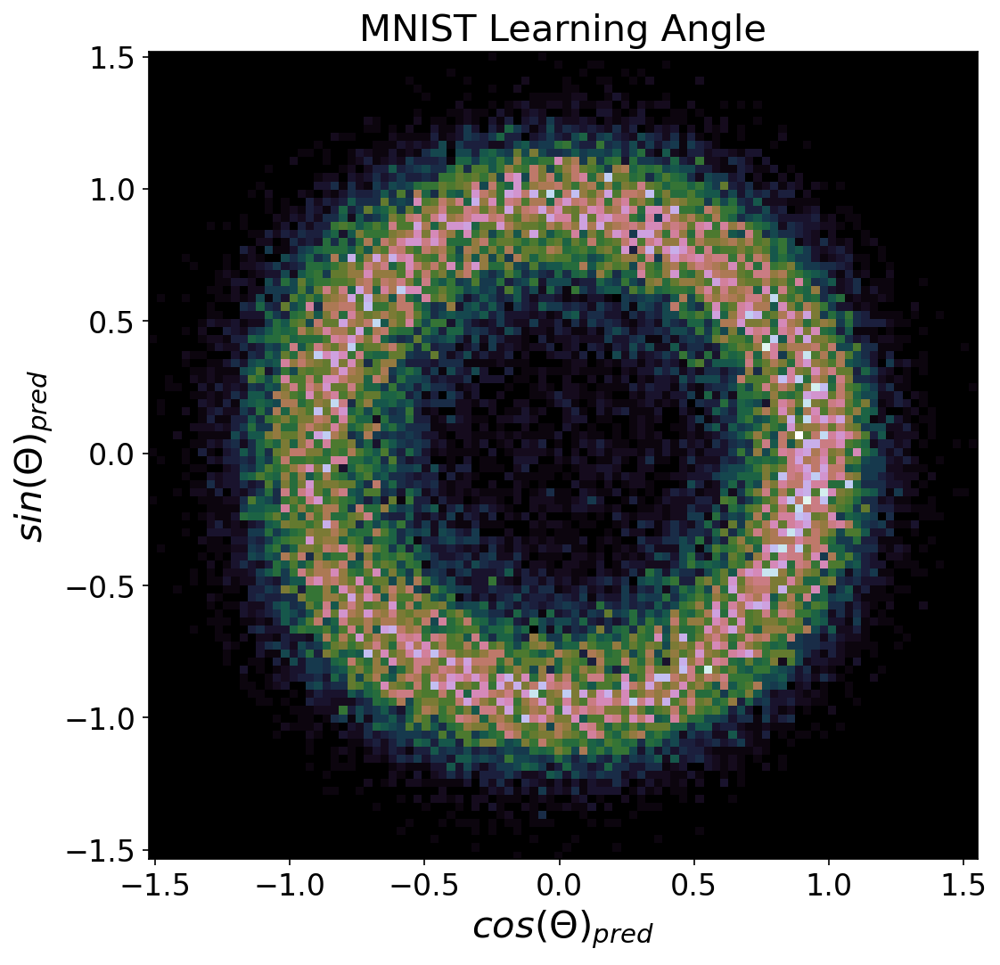

In [48]:
fig = plt.figure(figsize=(8,8),dpi=150)
ax = fig.add_subplot(111) 
#plt.scatter(Y_test,np.square(y_pred_test-Y_test),s=1)
ax.hist2d(np.array(y_pred_testx[:,0]).T, np.array(y_pred_testy[:,0]).T,
          bins=[100,100],cmap='cubehelix')
#plt.ylim([-1.1,1.1])
#for i in np.array((np.mod([2*np.pi/M,np.pi/3,2*np.pi/3,3*np.pi/3,4*np.pi/3,5*np.pi/3],np.pi)-0.5)/np.pi):
#    plt.vlines(i,-2,2,'w')

plt.ylabel('$sin(\Theta)_{pred}$')
plt.xlabel('$cos(\Theta)_{pred}$')
plt.title('MNIST Learning Angle')
plt.show()

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import sklearn.datasets
import umap
import umap.plot
import datashader as ds, pandas as pd, colorcet as cc

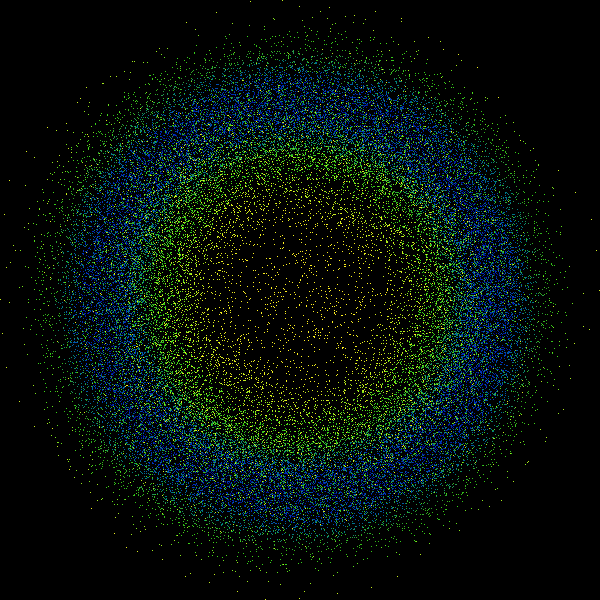

In [96]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx[:,0],y_pred_testy[:,0],l2[:,0],l2x[:,0],l2y[:,0]]).T,columns=["x", "y","l2","lx","ly"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("l2"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

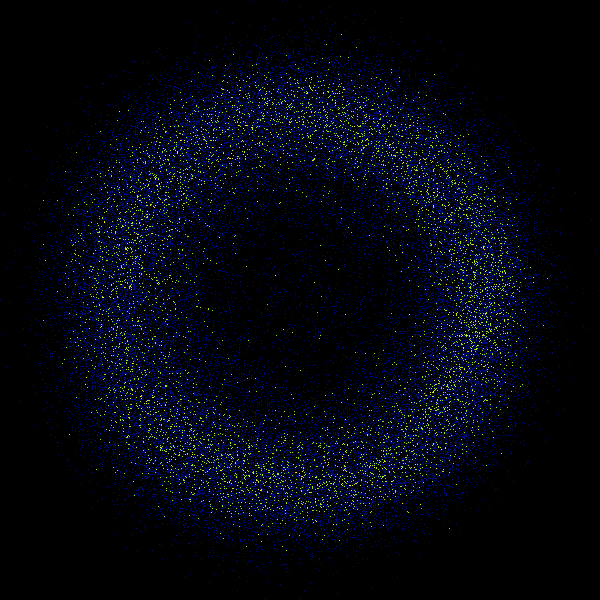

In [95]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx[:,0],y_pred_testy[:,0],l2[:,0]]).T,columns=["x", "y","l2"])
agg = ds.Canvas().points(pd_v,'x','y',ds.count())
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

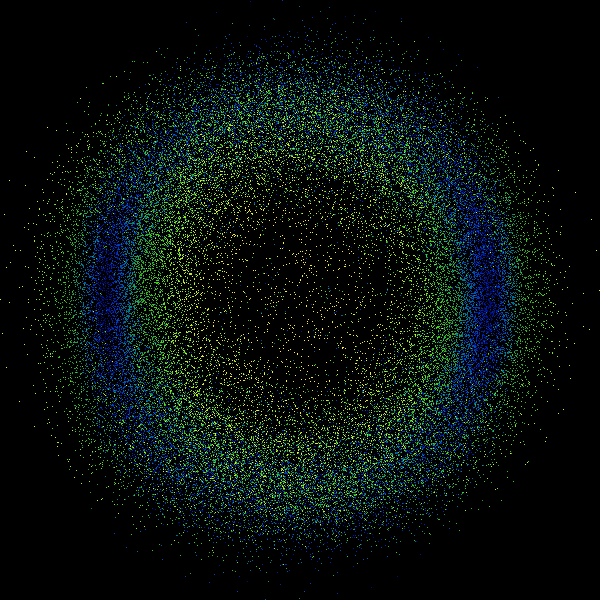

In [94]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx[:,0],y_pred_testy[:,0],l2[:,0],l2x[:,0],l2y[:,0]]).T,columns=["x", "y","l2","lx","ly"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("lx"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

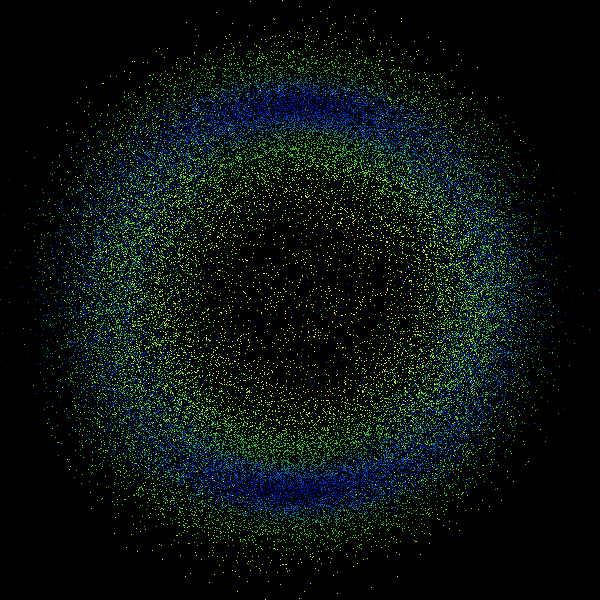

In [92]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx[:,0],y_pred_testy[:,0],l2[:,0],l2x[:,0],l2y[:,0]]).T,columns=["x", "y","l2","lx","ly"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("ly"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

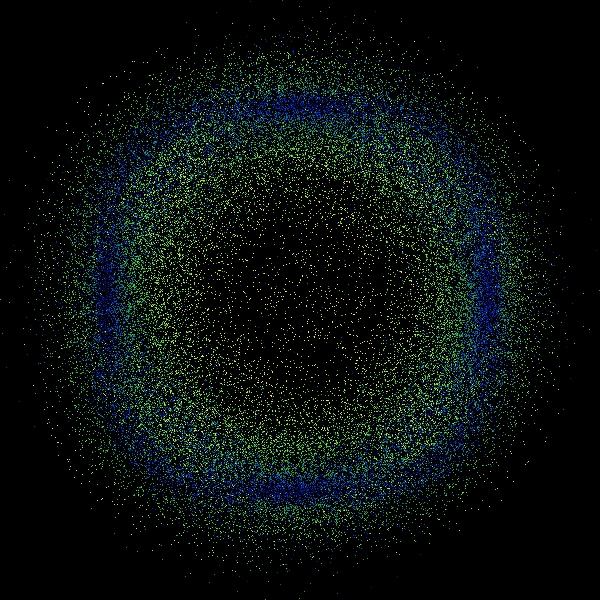

In [91]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx[:,0],y_pred_testy[:,0],l2[:,0],l2x[:,0],l2y[:,0],l2min[:,0]]).T,columns=["x", "y","l2","lx","ly","l2min"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("l2min"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

In [106]:
n_label = 0

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_trx = np.array([
    np.cos(2*np.mod(angle_train[tr_slice],np.pi))
]).T

X_testx = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testx = np.array([
    np.cos(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_trx, Y_trx)
y_pred_testx = reg.predict(X_testx)
y_pred_trainx = reg.predict(X_trx)

train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_try = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_try = np.array([
    np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
]).T

X_testy = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testy = np.array([
    np.sin(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_try, Y_try)
y_pred_testy = reg.predict(X_testy)
y_pred_trainy = reg.predict(X_try)

train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))

l2 = np.square(y_pred_testx-Y_testx) + np.square(y_pred_testy-Y_testy)

y_pred_testx_0 = copy.deepcopy(y_pred_testx)
y_pred_testy_0 = copy.deepcopy(y_pred_testy)
l2_0 = copy.deepcopy(l2)

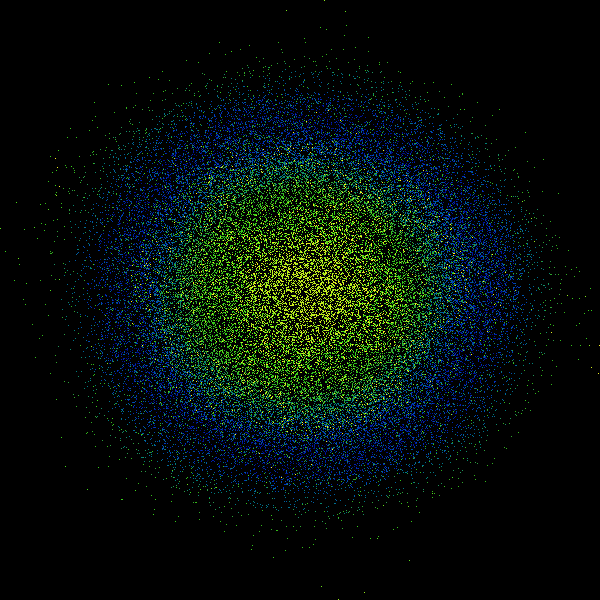

In [107]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx_0[:,0],y_pred_testy_0[:,0],l2_0[:,0]]).T,columns=["x", "y","l2"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("l2"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

In [387]:
mnist_DHC_out_train_L4s.shape

(1440000, 464)

In [104]:
n_label = 1

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_trx = np.array([
    np.cos(2*np.mod(angle_train[tr_slice],np.pi))
]).T

X_testx = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testx = np.array([
    np.cos(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_trx, Y_trx)
y_pred_testx = reg.predict(X_testx)
y_pred_trainx = reg.predict(X_trx)

train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_try = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_try = np.array([
    np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
]).T

X_testy = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testy = np.array([
    np.sin(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_try, Y_try)
y_pred_testy = reg.predict(X_testy)
y_pred_trainy = reg.predict(X_try)

train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))

l2 = np.square(y_pred_testx-Y_testx) + np.square(y_pred_testy-Y_testy)

y_pred_testx_1 = copy.deepcopy(y_pred_testx)
y_pred_testy_1 = copy.deepcopy(y_pred_testy)
l2_1 = copy.deepcopy(l2)

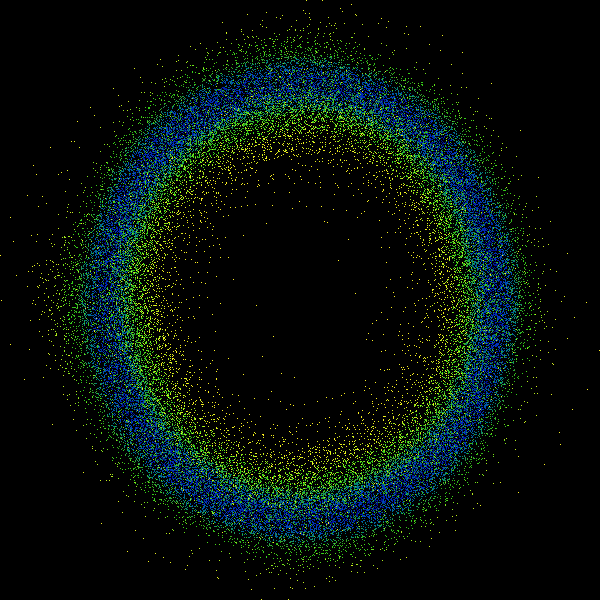

In [105]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx_1[:,0],y_pred_testy_1[:,0],l2_1[:,0]]).T,columns=["x", "y","l2"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("l2"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

In [108]:
n_label = 9

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_trx = np.array([
    np.cos(2*np.mod(angle_train[tr_slice],np.pi))
]).T

X_testx = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testx = np.array([
    np.cos(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_trx, Y_trx)
y_pred_testx = reg.predict(X_testx)
y_pred_trainx = reg.predict(X_trx)

train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

NTrainSubset = 12
idx = np.round(np.linspace(0, NtrainAngle - 1, 12)).astype(int)
sc = StandardScaler()
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)

X_try = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
Y_try = np.array([
    np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
]).T

X_testy = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
Y_testy = np.array([
    np.sin(2*np.mod(angle_test[tst_slice],np.pi))
]).T

reg = LinearRegression().fit(X_try, Y_try)
y_pred_testy = reg.predict(X_testy)
y_pred_trainy = reg.predict(X_try)

train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))

l2 = np.square(y_pred_testx-Y_testx) + np.square(y_pred_testy-Y_testy)

y_pred_testx_9 = copy.deepcopy(y_pred_testx)
y_pred_testy_9 = copy.deepcopy(y_pred_testy)
l2_9 = copy.deepcopy(l2)

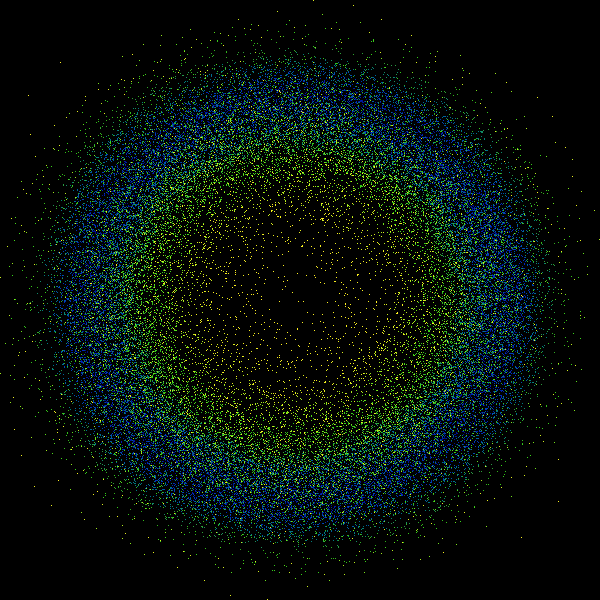

In [109]:
pd_v = pd.DataFrame(data=np.array([y_pred_testx_9[:,0],y_pred_testy_9[:,0],l2_9[:,0]]).T,columns=["x", "y","l2"])
agg = ds.Canvas().points(pd_v,'x','y',ds.mean("l2"))
ds.tf.set_background(ds.tf.shade(agg, cmap=cc.bgy), "black")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
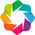

In [298]:
import datashader as ds
import numpy as np
import holoviews as hv

from holoviews import opts
from holoviews.operation.datashader import datashade, shade, dynspread, spread, rasterize
from holoviews.operation import decimate

hv.extension('bokeh')

In [148]:
import dask.dataframe as dd

In [180]:
pd_v['l2']

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/pandas/io/formats/format.py:1405: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())
/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/pandas/io/formats/format.py:1405: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


0        1.118564
1        1.119025
2        1.033290
3        0.977758
4        0.999856
           ...   
48427    0.006393
48428    0.009564
48429    0.016019
48430    0.023364
48431    0.019047
Name: l2, Length: 48432, dtype: category
Categories (48432, float64): [7.339531e-08, 1.602895e-07, 4.669307e-07, 3.730116e-06, ..., 1.983650, 2.055775, 2.064013, 2.122687]

In [184]:
pd_v['l2'] = pd_v['l2'].astype(np.float64)

In [177]:
points = hv.Points(hv.Dataset(pd_v, kdims=['x', 'y'], vdims=['l2']))

In [198]:
from bokeh.themes import built_in_themes
from bokeh.io import curdoc
curdoc().theme = 'dark_minimal'

In [203]:
datashade(points, aggregator=ds.mean('l2'),cmap=cc.bgy).opts(bgcolor='black')

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [229]:
p9 = rasterize(points, aggregator=ds.mean('l2')).opts(cmap="bgy",bgcolor='black',cnorm="eq_hist",colorbar=True,height=380, width=450,tools=["hover"])

In [234]:
hv.Layout([p9,p9])

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (x_y l2)

In [226]:
pd_v["l2"].min(),pd_v["l2"].max()

(7.339530681971093e-08, 2.122687472316385)

In [158]:
from datashader.mpl_ext import DSArtist

In [155]:
pd_v(ds.mean("l2"))

TypeError: 'DataFrame' object is not callable

In [302]:
hv.output(backend="matplotlib")

:RGB   [x,y]   (R,G,B,A)
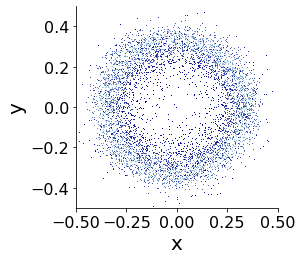

In [164]:
hv.RGB(np.array(ds.tf.shade(agg).to_pil()))

In [165]:
hd.shade(hv.Image(agg))

NameError: name 'hd' is not defined

In [174]:
hv.Points(agg, vdims=(2,))

ValueError: Dimensions specified as a tuple must be a tuple consisting of the name and label not: (2,)

In [294]:
pd_v0 = pd.DataFrame(data=np.array([y_pred_testx_0[:,0],y_pred_testy_0[:,0],np.log10(l2_0[:,0])]).T,columns=["x", "y","l2"])
pd_v1 = pd.DataFrame(data=np.array([y_pred_testx_1[:,0],y_pred_testy_1[:,0],np.log10(l2_1[:,0])]).T,columns=["x", "y","l2"])
pd_v9 = pd.DataFrame(data=np.array([y_pred_testx_9[:,0],y_pred_testy_9[:,0],np.log10(l2_9[:,0])]).T,columns=["x", "y","l2"])

In [304]:
ropts = dict(cmap="bgy",
             bgcolor='black',
             cnorm="eq_hist",
             colorbar=True,
             height=380,
             width=450,
             tools=["hover"],
             colorbar_position="right",
             xlabel='cos(θ)',
             ylabel='sin(θ)',
             sublabel_format=""
            )

points = hv.Points(hv.Dataset(pd_v0, kdims=['x', 'y'], vdims=['l2']))
p0 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 0')
points = hv.Points(hv.Dataset(pd_v1, kdims=['x', 'y'], vdims=['l2']))
p1 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 1')
points = hv.Points(hv.Dataset(pd_v9, kdims=['x', 'y'], vdims=['l2']))
p9 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 9')

In [301]:
hv.Layout([p0,p1,p9]).cols(1)

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.II  :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.III :DynamicMap   []
      :Image   [x,y]   (x_y l2)

In [284]:
hv.save(lay, 'temp.png', fmt='png',dpi=150)

In [323]:
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.II  :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.III :DynamicMap   []
      :Image   [x,y]   (x_y l2)
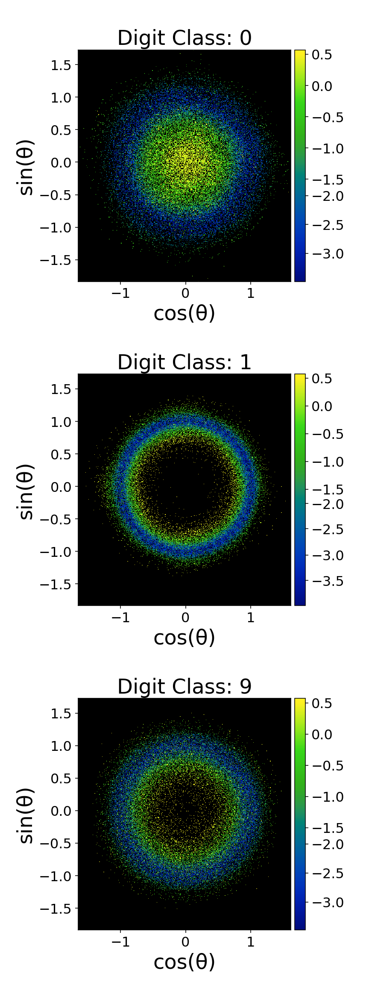

In [364]:
ropts = dict(cmap="bgy",
             bgcolor='black',
             cnorm="eq_hist",
             colorbar=True,
             xlabel='cos(θ)',
             ylabel='sin(θ)',
             sublabel_format="",
             #cbar_ticks=5,
             clabel='',
             fontsize=24,
            )

points = hv.Points(hv.Dataset(pd_v0, kdims=['x', 'y'], vdims=['l2']))
p0 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 0')
points = hv.Points(hv.Dataset(pd_v1, kdims=['x', 'y'], vdims=['l2']))
p1 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 1')
points = hv.Points(hv.Dataset(pd_v9, kdims=['x', 'y'], vdims=['l2']))
p9 = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 9')

test = hv.Layout([p0,p1,p9]).cols(1).opts(vspace=0.4,fig_bounds=(0.1, 0.07, 0.9, 0.95))
test

In [369]:
hv.output(aspect=0.1)
hv.save(test, 'temp.png', fmt='png',dpi=150,backend='matplotlib')

In [373]:
NTrainSubset_list = [12]
std_class_both = np.zeros((len(NTrainSubset_list),10,9))
std_class_both_angle = np.zeros((len(NTrainSubset_list),10,NtestAngle))
for i in tqdm(range(len(NTrainSubset_list))):
    NTrainSubset = NTrainSubset_list[i]
    idx = np.round(np.linspace(0, NtrainAngle - 1, NTrainSubset)).astype(int)

    sc = StandardScaler()
    tr_slice = np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx])
    tst_slice = np.isin(angle_test_class,[0,1,2,3,4,5,6,7,8,9])

    X_trx = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
    Y_trx = np.array([
        np.cos(2*np.mod(angle_train[tr_slice],np.pi))
    ]).T

    X_testx = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
    Y_testx = np.array([
        np.cos(2*np.mod(angle_test[tst_slice],np.pi))
    ]).T

    reg = LinearRegression().fit(X_trx, Y_trx)
    y_pred_testx = reg.predict(X_testx)
    y_pred_trainx = reg.predict(X_trx)

    train_lossl2x = np.mean(np.square(y_pred_trainx-Y_trx))
    test_lossl2x = np.mean(np.square(y_pred_testx-Y_testx))

    X_try = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
    Y_try = np.array([
        np.sin(2*np.mod(angle_train[tr_slice],np.pi)),
    ]).T

    X_testy = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
    Y_testy = np.array([
        np.sin(2*np.mod(angle_test[tst_slice],np.pi))
    ]).T

    reg = LinearRegression().fit(X_try, Y_try)
    y_pred_testy = reg.predict(X_testy)
    y_pred_trainy = reg.predict(X_try)

    train_lossl2y = np.mean(np.square(y_pred_trainy-Y_try))
    test_lossl2y = np.mean(np.square(y_pred_testy-Y_testy))
    
    X_trc = sc.fit_transform(np.log10(mnist_DHC_out_train_L4s[tr_slice]))
    Y_trc = train_y_onehot[tr_slice]

    X_testc = sc.transform(np.log10(mnist_DHC_out_test_L4s[tst_slice]))
    Y_testc = test_y_onehot[tst_slice]

    reg = LinearRegression().fit(X_trc, Y_trc)
    y_pred_testc = reg.predict(X_testc)
    y_pred_trainc = reg.predict(X_trc)

    train_lossl2c = np.square(y_pred_trainc-Y_trc)
    test_lossl2c = np.square(y_pred_testc-Y_testc)

    diff = 180*(np.arctan2(Y_testy[:,0],Y_testx[:,0])/np.pi-np.arctan2(y_pred_testy[:,0],y_pred_testx[:,0])/np.pi)
    diff[diff<-180]+=360
    diff[diff>180]-=360

    class_pred = np.argmax(y_pred_testc,axis=1)
    y_class = angle_test_class[tst_slice]
    cmat = cm_eval(class_pred,y_class,10)

100%|██████████| 1/1 [03:01<00:00, 181.48s/it]


In [384]:
y_pred_testx[tst_slice,0].shape, test_lossl2c[tst_slice,0].shape


((48432,), (48432,))

In [385]:
n_label = 0
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)
pd_v0c = pd.DataFrame(data=np.array([y_pred_testx[tst_slice,0],y_pred_testy[tst_slice,0],np.log10(test_lossl2c[tst_slice,0])]).T,columns=["x", "y","l2"])
n_label = 1
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)
pd_v1c = pd.DataFrame(data=np.array([y_pred_testx[tst_slice,0],y_pred_testy[tst_slice,0],np.log10(test_lossl2c[tst_slice,0])]).T,columns=["x", "y","l2"])
n_label = 9
tr_slice = np.logical_and(np.isin(angle_train,mnist_DHC_out_train_L4s_angles[idx]),np.isin(angle_train_class,n_label))
tst_slice = np.isin(angle_test_class,n_label)
pd_v9c = pd.DataFrame(data=np.array([y_pred_testx[tst_slice,0],y_pred_testy[tst_slice,0],np.log10(test_lossl2c[tst_slice,0])]).T,columns=["x", "y","l2"])

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.II  :DynamicMap   []
      :Image   [x,y]   (x_y l2)
   .DynamicMap.III :DynamicMap   []
      :Image   [x,y]   (x_y l2)
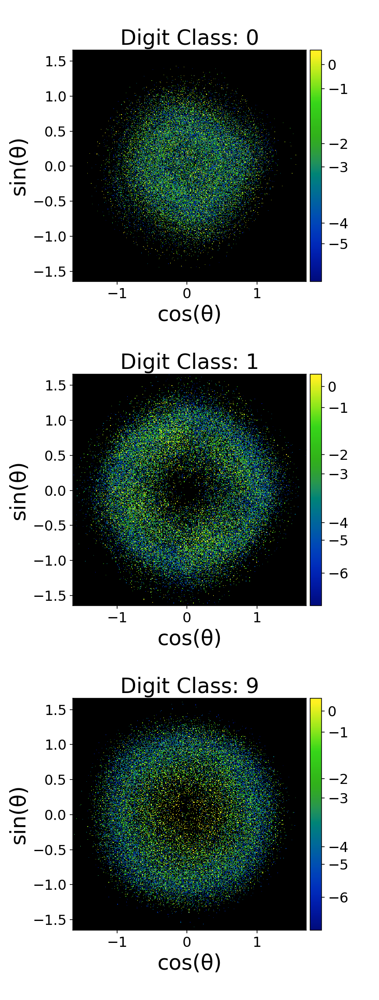

In [386]:
ropts = dict(cmap="bgy",
             bgcolor='black',
             cnorm="eq_hist",
             colorbar=True,
             xlabel='cos(θ)',
             ylabel='sin(θ)',
             sublabel_format="",
             #cbar_ticks=5,
             clabel='',
             fontsize=24,
            )

points = hv.Points(hv.Dataset(pd_v0c, kdims=['x', 'y'], vdims=['l2']))
p0c = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 0')
points = hv.Points(hv.Dataset(pd_v1c, kdims=['x', 'y'], vdims=['l2']))
p1c = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 1')
points = hv.Points(hv.Dataset(pd_v9c, kdims=['x', 'y'], vdims=['l2']))
p9c = rasterize(points, aggregator=ds.mean('l2')).opts(**ropts, title='Digit Class: 9')

test = hv.Layout([p0c,p1c,p9c]).cols(1).opts(vspace=0.4,fig_bounds=(0.1, 0.07, 0.9, 0.95))
test